<a name='0'></a>

# Object Detection with Detectron2

[Detectron2](https://github.com/facebookresearch/detectron2) is an open-source framework for object detection and image segmentation by Meta AI. 

Detectron2 is one of the best and simplest object detection frameworks. In this notebook, we will take a look at Detectron2 and in later notebooks, we will use it for detecting different objects in images.

![image](https://user-images.githubusercontent.com/1381301/66535560-d3422200-eace-11e9-9123-5535d469db19.png)
***Image by Detectron2***

***Outline***:

* [1. Overview of Detectron2](#1)
* [2. Detectron2 Model Zoos](#2)
* [3. Performing Inference with Pretrained Detector](#3)
  * [3.1 Set Up](#3-1)
  * [3.2 Getting an Image](#3-2)
  * [3.3 Getting a Pretrained Detector from Detectron2](#3-3)
  * [3.4 Visualizing the Prediction](#3-4)

* [4. References and Further Learning](#4)

<a name='1'></a>
## 1. Overview of Detectron2

Detectron2 is an open-source object detection and image segmentation tool designed by FAIR(now Meta AI). Detectron2 is faster, accurate, and it has modular design that make it easy to do rapid experimentation of object detection and segmentation tasks(most components are [plug and play](https://en.wikipedia.org/wiki/Plug_and_play)).

Detectron2 is a revamped [Detectron](https://research.facebook.com/blog/2018/01/facebook-open-sources-detectron/) that is rougly 3x faster. Detectron was released in 2018 as open-source tool to help reseachers do object detection easily. Since then, it has improved a lot. As [this](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) blog post states, Detectron2 powers many real computer vision projects at Meta(former Facebook).

The level of modularity that Detectron2 provides is really fascinating. All models in detectron2 are implemented in a way that you can easily change the backbone network(either with existing network or custom network), the detection head and even the type of task(either detection, segmentation, [keypoint detection](https://paperswithcode.com/task/keypoint-detection)), you can plug in your own dataset. Below image shows the generalized R-CNN models. As you can see from image that pretty much anything from the whole detection workflow can be changed on the fly.

![image](https://drive.google.com/uc?export=view&id=1Wgd_n8ceQVE08EzOk1ThSQtP3aV6U-rq)

Detectron2 has 7 most important modules that are: [Datasets](https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html), [DataLoader](https://detectron2.readthedocs.io/en/latest/tutorials/data_loading.html), [Model](https://detectron2.readthedocs.io/en/latest/tutorials/models.html), user Input, [Evaluation](https://detectron2.readthedocs.io/en/latest/tutorials/evaluation.html), [Visualization](https://detectron2.readthedocs.io/en/latest/modules/utils.html#module-detectron2.utils.visualizer), and User Code. Below image illustrates those modules in a better way.

![image](https://drive.google.com/uc?export=view&id=1B_dGxQVLrHrnCtCKYlGoouuSfAvl-ZlF)











<a name='2'></a>
## 2. Detectron2 Model Zoos

Detectron2 contains various object detection and image segmentation models, but interestingly, most of them are based on [R-CNN](https://arxiv.org/abs/1311.2524#), one of the earliest object detectors. That is perhaps why Detectron2 has extensive modularity and consistent design across different models.


![image](https://drive.google.com/uc?export=view&id=1YxN82o6dFcznQ_7W7hz7Y377HZVkSgG0)

The up-todate models contained in Detectron2 can be found on Github: [Detectron2 Model Zoo and Baselines](https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md). Currently, Detectron2 contains the following models:

* Object detectors: [Faster R-CNN](https://arxiv.org/abs/1506.01497v3), [RetinaNet](https://arxiv.org/abs/1708.02002), [Cascade R-CNN](https://arxiv.org/abs/1712.00726), [Mask R-CNN](https://arxiv.org/abs/1703.06870).
* Image segmentation: [Keypoint R-CNN](https://arxiv.org/abs/2008.00460), [Panoptic FPN](https://arxiv.org/abs/2204.05370), [Mask R-CNN](https://arxiv.org/abs/1703.06870).

*Note: Mask R-CNN was released as instance segmentation model but it can also be used for object detection as well.*

There are other projects built on top of Detectron2 such as [DensePose](https://arxiv.org/abs/1802.00434), [TensorMask](https://arxiv.org/abs/1903.12174), [Mesh R-CNN](https://arxiv.org/abs/1906.02739), [DETR](https://arxiv.org/abs/2005.12872v3), and [DeepLab](https://arxiv.org/abs/1606.00915). The full list of projects (from Meta scientists) and other external projects that are built on top of Detectron2 is available [here](https://github.com/facebookresearch/detectron2/tree/main/projects).




<a name='3'></a>
## 3. Performing Inference with Detectron2

Since Detectron2 contains pretrained object detection and image segmentation models, it's possible to perform inference on video or images using those pretrained models.

Let's see how do that! But we will have to install and import all required tools first!

<a name='3-1'></a>
### 3.1 Set Up

Below we install & import all dependencies that are required to perform inference on images. For full instructions on how to install Detectron2 locally, see the [documentation](https://detectron2.readthedocs.io/en/latest/tutorials/install.html).

In [9]:
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__)
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
exit(0) # Restart the runtime after installing dependencies. It's always recommended

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-dh0_wise
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-dh0_wise
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=264331 sha256=adf596e25f93a179a3d74a9fd8f6cc87d0f119f0df335d52eef66816bee1d7f4
  Stored in directory: /tmp/pip-ephem-wheel-cache-f12as5il/wheels/e2/6b/1d/344ac773c7495ea0b85eb228bc66daec7400a143a92d36b7b1
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.4
    Uninstalling pycocotools-2.0.4:
      Successfully uninstalled pycocotools-2.0.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
detectron2 0.3+cu101 requires pycocotools>=2.0.2, but you have py

If current stable version of torch matches with the detectron2, you don't need to install torch. You can just import it (`import torch`) without having to install it. At the time of writing this tutorial, there was mismatch between current torch and detectron2.

In [2]:
import detectron2

# initialize Detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data import DatasetCatalog

# import basic tools
import numpy as np
import cv2 # OpenCV is pre-installed on Google Colab
import random
from google.colab.patches import cv2_imshow

<a name='3-2'></a>
### 3.2 Get the Image

In [3]:
!wget https://upload.wikimedia.org/wikipedia/commons/1/11/School_Boys_of_HHJH_Playing_Basketball_2010-4-16.jpg -q -O test_image.jpg
test_image = cv2.imread("./test_image.jpg")

Below, we visualize the image we downloaded with `cv2_imshow`. Be aware that the normal OpenCV `cv2.imshow()` crashes in Colab.

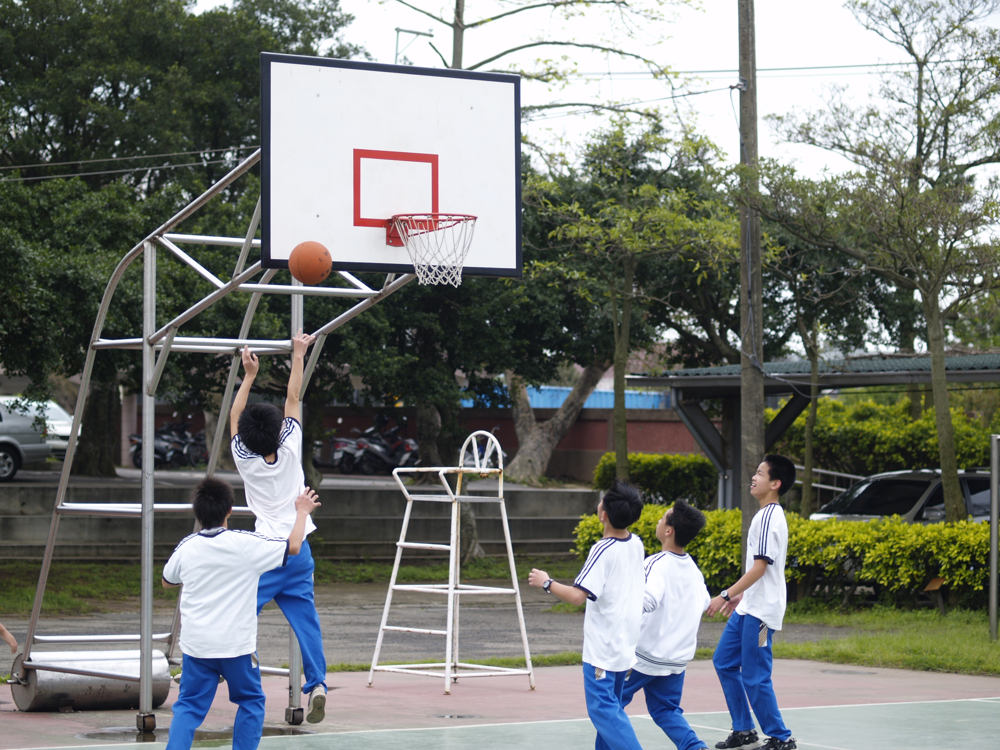

In [4]:
cv2_imshow(test_image)

<a name='3-3'></a>
### 3.3 Getting a Pretrained Detector from Detectron2

Now that we have our image, let's get the pre-trained detector from Detectron2. For simplicity, we will use RetinaNet. It's simple and it has a good accuracy-complexity trade-off.

In [35]:
# Get the default config
cfg = get_cfg()

# Merge the config of RetinaNet to cfg(default config)
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))

# Set a threshold
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.3

# Find a model from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")

# Define a predictor
predictor = DefaultPredictor(cfg)

# Make predictions on the test image with predictor
outputs = predictor(test_image)

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


The output of the `predictor` is a list of dictionaries, each dictionary holding the output of each image passed during inference. Since we are only running the model on one image, the `outputs` is a dictionary of different fields such as `pred_boxes`, `scores`, `pred_classes`, etc...See the [documentation](https://detectron2.readthedocs.io/en/latest/tutorials/models.html#model-output-format) for a full description of model output format and fields.

In [36]:
# With one input image, the output of model is the dictionary of different fields
print(f"Object scores: {outputs['instances'].scores}")
print(f"Object classes: {outputs['instances'].pred_classes}")
print(f"Predicted boxes: {outputs['instances'].pred_boxes}")

Object scores: tensor([0.9350, 0.8699, 0.7936, 0.7562, 0.7408, 0.7301, 0.6713, 0.6650, 0.5537,
        0.4409, 0.3529, 0.3287, 0.3188], device='cuda:0')
Object classes: tensor([ 0,  0,  0,  0,  3,  2,  0,  2,  3,  2,  7, 32, 13], device='cuda:0')
Predicted boxes: Boxes(tensor([[1.8031e+03, 1.1586e+03, 2.0467e+03, 1.9175e+03],
        [1.4249e+03, 1.2549e+03, 1.7514e+03, 1.9132e+03],
        [1.5775e+03, 1.2754e+03, 1.8328e+03, 1.9161e+03],
        [4.8958e+02, 9.6958e+02, 8.3185e+02, 1.8808e+03],
        [8.4699e+02, 1.0784e+03, 1.0514e+03, 1.2148e+03],
        [1.0586e+00, 1.0175e+03, 1.3856e+02, 1.2310e+03],
        [4.0330e+02, 1.2242e+03, 7.7338e+02, 1.8982e+03],
        [2.0679e+03, 1.1991e+03, 2.5303e+03, 1.3443e+03],
        [3.2260e+02, 1.0668e+03, 5.3760e+02, 1.2009e+03],
        [1.1605e+02, 1.0401e+03, 1.8485e+02, 1.1340e+03],
        [4.7624e-01, 1.0170e+03, 1.3328e+02, 1.2309e+03],
        [7.3959e+02, 6.1738e+02, 8.4953e+02, 7.3225e+02],
        [1.4925e+01, 1.6681e+03, 4

When dealing with the output of object detector, the most important object things are predicted boxes, classes, and scores. For how to interpret other tasks such as segmentation, see the [documentation](print(outputs["instances"].pred_boxes)
).

<a name='3-4'></a>
### 3.4 Visualizing the Prediction

One of the nice things about Detectron2 is how easier it is to visualize the predicted objects and the bounding boxes. With the [utility function](https://detectron2.readthedocs.io/en/latest/modules/utils.html?highlight=Visualizer#module-detectron2.utils.video_visualizer) `Visualizer`, it takes less than five lines of codes to make neat visualizations.

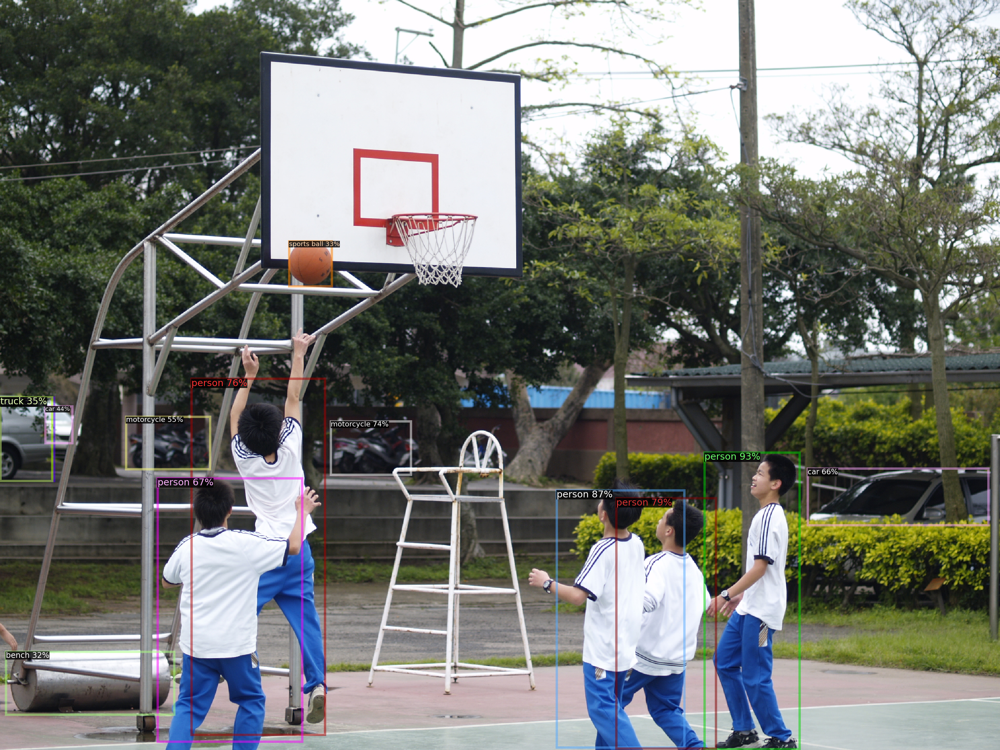

In [37]:
viz = Visualizer(test_image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2) #input image must be RGB
output = viz.draw_instance_predictions(outputs["instances"].to("cpu"))

# The output.get_image() returns visualized image of shape (H,W,3) RGB and OpenCV cv2_imshow uses BGR model by default.
# Thus, reverse the color mode with `output.get_image()[:, :, ::-1]` or convert to BGR with `cv2.cvtColor(output.get_image(),cv2.COLOR_RGB2BGR))`
# The latter is clear
cv2_imshow(cv2.cvtColor(output.get_image(), cv2.COLOR_RGB2BGR))

That's it with performing inference with Detectron2 pretrained object detection and image segmentation models. Our results are not perfect, but they are resonably good. In the next notebooks, we will use custom datasets and that's where things will get interesting!

<a name='4'></a>
## 4. References and Further Learning

For more about Detectron2, I recommend you check the following resources.

* [Detectron2 - Yuxin Wu Youtube](https://www.youtube.com/watch?v=geyNLYPAH_Y)
* [Detectron2 Beginner's Tutorial](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=QHnVupBBn9eR)
* [Blog: Detectron2: A PyTorch-based modular object detection library](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/)
* [Official Documentation](https://detectron2.readthedocs.io/en/latest/index.html) and [Github repository](https://github.com/facebookresearch/detectron2)

### [BACK TO TOP](#0)